In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso , LassoCV ,Ridge ,RidgeCV ,ElasticNet , ElasticNetCV ,LogisticRegression
from sklearn.metrics import accuracy_score ,confusion_matrix , roc_curve , roc_auc_score
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pickle

In [19]:
df=pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [20]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [21]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [23]:
df["Glucose"]=df["Glucose"].replace(0,df["Glucose"].mean())

In [24]:
df["BMI"]=df["BMI"].replace(0 , df["BMI"].mean())

In [25]:
df["BloodPressure"]=df["BloodPressure"].replace(0 , df["BloodPressure"].mean())

In [26]:
df["SkinThickness"]=df["SkinThickness"].replace(0 , df["SkinThickness"].mean())

In [27]:
df["Insulin"]=df["Insulin"].replace(0 , df["Insulin"].mean())

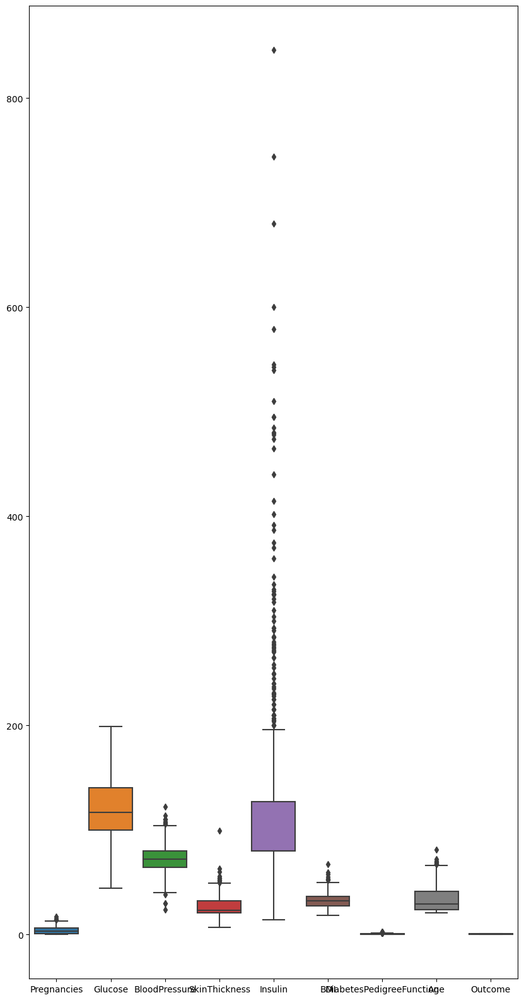

In [28]:
fig , ax = plt.subplots(figsize=(10,20))
sns.boxplot(data=df , ax=ax)
plt.show()

In [29]:
#Removing Outliers

q=df["Insulin"].quantile(.95)
df_new=df[df["Insulin"] < q]

In [30]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [49]:
#Outliers Treatement

q=df["Pregnancies"].quantile(.98)
df_new=df[df["Pregnancies"]  < q]

q=df_new["BMI"].quantile(.99)
df_new=df_new[df_new["BMI"]  < q]

q=df_new["SkinThickness"].quantile(.99)
df_new=df_new[df_new["SkinThickness"]  < q]


q=df_new["Insulin"].quantile(.95)
df_new=df_new[df_new["Insulin"]  < q]


q=df_new["DiabetesPedigreeFunction"].quantile(.99)
df_new=df_new[df_new["DiabetesPedigreeFunction"]  < q]

q=df_new["Age"].quantile(.99)
df_new=df_new[df_new["Age"]  < q]


In [50]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


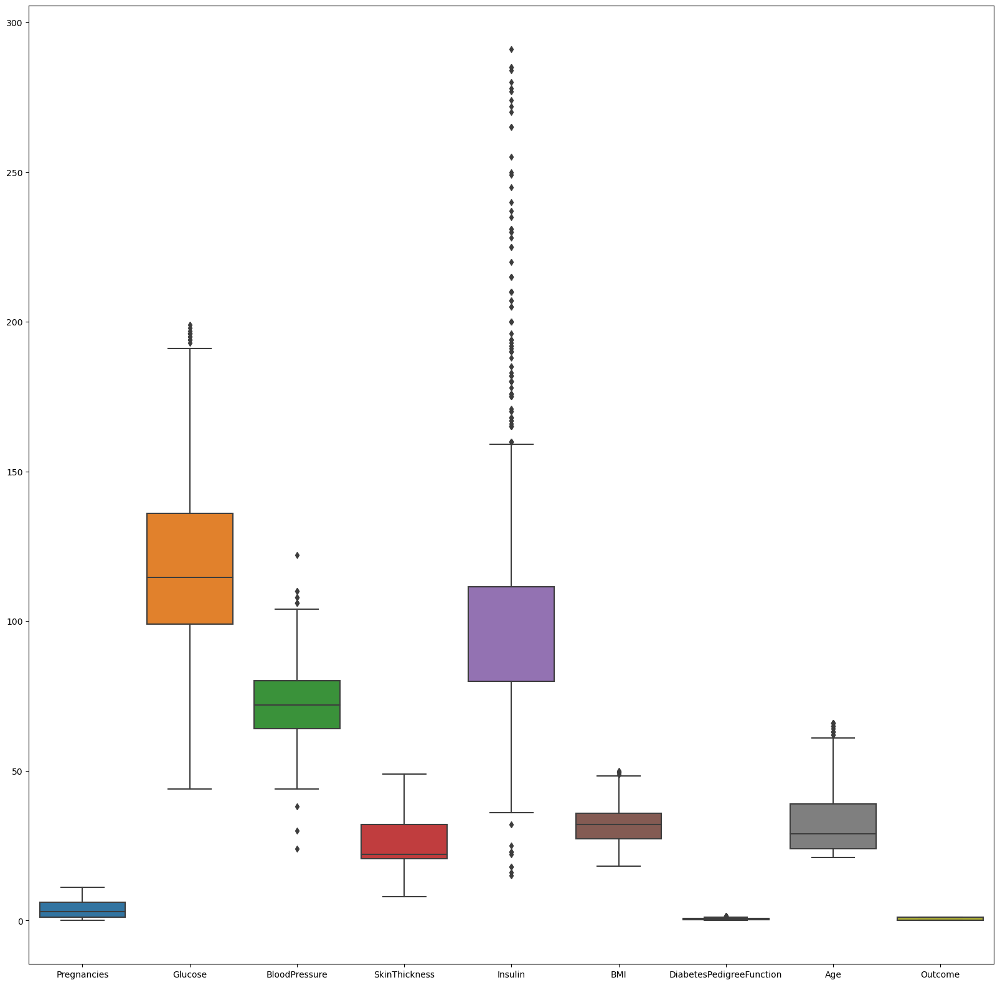

In [52]:
fig , ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new , ax=ax)
plt.show()

In [53]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [54]:
#Splitting the Dataset

y=df_new["Outcome"]

In [55]:
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 674, dtype: int64

In [56]:
X=df_new.drop(columns="Outcome")

In [57]:
X

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [58]:
scalar=StandardScaler()
scalar.fit_transform(df_new)

array([[ 7.96753910e-01,  9.83984062e-01,  4.52611463e-04, ...,
         6.30484542e-01,  1.60141519e+00,  1.43170310e+00],
       [-8.64793539e-01, -1.16977621e+00, -5.04474494e-01, ...,
        -3.38078670e-01, -1.32706484e-01, -6.98468839e-01],
       [ 1.46137289e+00,  2.18051755e+00, -6.72783529e-01, ...,
         7.88402456e-01, -4.14369227e-02,  1.43170310e+00],
       ...,
       [ 4.64444420e-01,  6.09439465e-02,  4.52611463e-04, ...,
        -7.10063091e-01, -2.23976046e-01, -6.98468839e-01],
       [-8.64793539e-01,  2.31877301e-01, -1.00940160e+00, ...,
        -3.45097244e-01,  1.32760650e+00,  1.43170310e+00],
       [-8.64793539e-01, -8.96282840e-01, -1.67856424e-01, ...,
        -4.64413001e-01, -8.62862978e-01, -6.98468839e-01]])

In [60]:
ProfileReport(pd.DataFrame(scalar.fit_transform(df_new)))

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [61]:
df_new_scalar=pd.DataFrame(scalar.fit_transform(df_new))

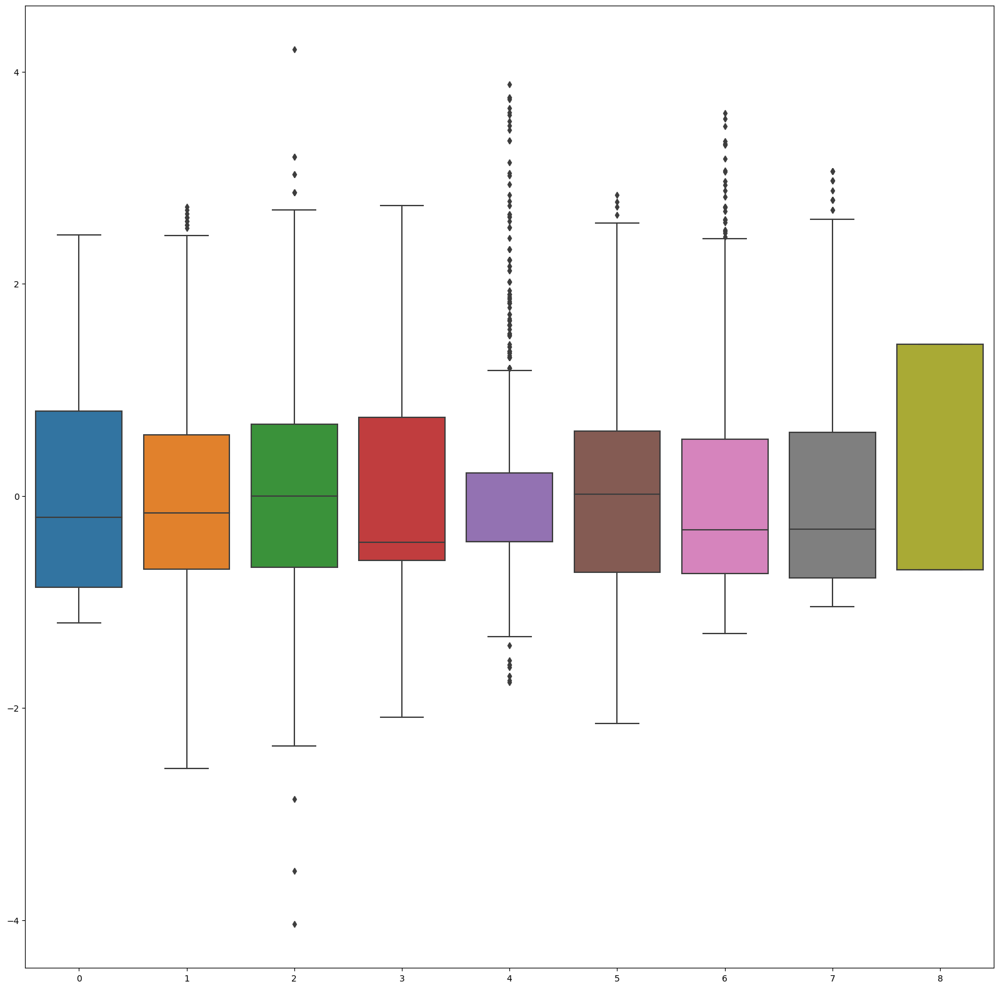

In [62]:
fig , ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new_scalar , ax=ax)
plt.show()

In [63]:
X_scaled=scalar.fit_transform(X)

In [64]:
X_scaled

array([[ 7.96753910e-01,  9.83984062e-01,  4.52611463e-04, ...,
         2.65819648e-01,  6.30484542e-01,  1.60141519e+00],
       [-8.64793539e-01, -1.16977621e+00, -5.04474494e-01, ...,
        -8.31445036e-01, -3.38078670e-01, -1.32706484e-01],
       [ 1.46137289e+00,  2.18051755e+00, -6.72783529e-01, ...,
        -1.34872696e+00,  7.88402456e-01, -4.14369227e-02],
       ...,
       [ 4.64444420e-01,  6.09439465e-02,  4.52611463e-04, ...,
        -8.94145875e-01, -7.10063091e-01, -2.23976046e-01],
       [-8.64793539e-01,  2.31877301e-01, -1.00940160e+00, ...,
        -2.82812694e-01, -3.45097244e-01,  1.32760650e+00],
       [-8.64793539e-01, -8.96282840e-01, -1.67856424e-01, ...,
        -2.35787064e-01, -4.64413001e-01, -8.62862978e-01]])

In [65]:
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 674, dtype: int64

In [66]:
#Need to check the Multicollinearity

vif_df=pd.DataFrame()

In [68]:
X_scaled.shape

(674, 8)

In [69]:
X_scaled.shape[1]

8

In [71]:
vif_df['vif']= [variance_inflation_factor(X_scaled,i)for i in range(X_scaled.shape[1])]

vif_df['feature']=X.columns

In [72]:
vif_df

,vif,feature
0,1.449056,Pregnancies
1,1.304263,Glucose
2,1.262686,BloodPressure
3,1.470049,SkinThickness
4,1.271017,Insulin
5,1.513160,BMI
6,1.042300,DiabetesPedigreeFunction
7,1.662728,Age


In [73]:
#No Multicollinearity exists in the Dataset , as the vif value is less than 10

In [75]:
x_train , x_test , y_train ,y_test=train_test_split(X_scaled , y , test_size=.20 , random_state=144)

In [76]:
x_train

array([[-0.86479354,  0.19769063, -1.85094678, ...,  0.21879402,
         1.80609569, -0.40651517],
       [ 2.45830136,  1.22329076,  0.33707068, ...,  0.21879402,
         3.1782269 ,  1.69268475],
       [ 0.13213493,  0.91561072,  1.09446134, ..., -0.47091521,
        -0.90658316, -0.49778473],
       ...,
       [-0.86479354, -0.28092276,  1.17861586, ..., -0.28281269,
        -1.06801036, -0.86286298],
       [ 1.46137289,  0.02675728,  0.50537972, ..., -1.08224839,
        -0.13454002,  2.87918905],
       [-0.86479354, -0.75953616, -0.33616546, ..., -0.73739378,
         2.27283086, -0.95413254]])

In [78]:
x_test

array([[ 1.32134931e-01, -1.44176079e-01,  4.52611463e-04, ...,
        -4.70915211e-01, -2.50346495e-01,  1.23633694e+00],
       [-1.19710303e+00,  6.76304024e-01, -8.41092564e-01, ...,
        -1.53682948e+00, -8.43415997e-01, -1.04540210e+00],
       [ 2.45830136e+00,  8.13050708e-01,  1.85185200e+00, ...,
         7.36075942e-01, -6.78479508e-01,  1.69268475e+00],
       ...,
       [ 7.96753910e-01, -5.54416131e-01, -5.04474494e-01, ...,
        -1.19197486e+00, -6.96025943e-01, -3.15245608e-01],
       [-5.32484049e-01, -1.20396288e+00, -2.43135269e-01, ...,
         1.38528976e-02, -5.03015158e-01, -1.04540210e+00],
       [-8.64793539e-01, -1.64838960e+00, -2.01925581e+00, ...,
        -1.80330804e+00, -4.36338705e-01, -9.54132539e-01]])

# Logistic Regression

In [106]:

logr=LogisticRegression(verbose=1)

In [107]:
logr.fit(x_train,y_train )

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [89]:
logr.predict(x_test[[1]])

array([0], dtype=int64)

In [90]:
logr.predict_proba(x_test[[1]])

array([[0.91629065, 0.08370935]])

In [91]:
logr.predict_log_proba(x_test[[1]])

array([[-0.08742167, -2.48040456]])

In [86]:
y_test

406    1
511    0
24     1
751    0
689    1
      ..
3      0
469    0
587    0
60     0
97     0
Name: Outcome, Length: 135, dtype: int64

In [92]:
y_test.iloc[1]

0

In [ ]:
#Checking with different "solver"

In [94]:
logr_liblinear=LogisticRegression(verbose=1,solver="liblinear")

In [95]:
logr_liblinear.fit(x_train,y_train)

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [96]:
logr_liblinear.predict(x_test[[1]])

array([0], dtype=int64)

In [97]:
logr_liblinear.predict_proba(x_test[[1]])

array([[0.91450958, 0.08549042]])

In [98]:
logr_liblinear.predict_log_proba(x_test[[1]])

array([[-0.08936734, -2.45935091]])

In [110]:
y_pred_liblinear=logr_liblinear.predict(x_test)

In [111]:
y_pred_liblinear

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [108]:
y_pred=logr.predict(x_test)

In [109]:
y_pred

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [112]:
confusion_matrix(y_test,y_pred_liblinear)

array([[77, 10],
       [24, 24]], dtype=int64)

In [113]:
confusion_matrix(y_test,y_pred)

array([[77, 10],
       [24, 24]], dtype=int64)

In [114]:
accuracy_score(y_test,y_pred)

0.7481481481481481

In [115]:
accuracy_score(y_test,y_pred_liblinear)

0.7481481481481481

In [120]:
auc=roc_auc_score(y_test,y_pred_liblinear)

In [121]:
auc

0.692528735632184

In [117]:
roc_auc_score(y_test,y_pred)

0.692528735632184

In [119]:
fpr , tpr , thresholds =roc_curve(y_test,y_pred_liblinear)

In [122]:
roc_curve(y_test,y_pred_liblinear)

(array([0.        , 0.11494253, 1.        ]),
 array([0. , 0.5, 1. ]),
 array([2, 1, 0], dtype=int64))

In [ ]:
#As per the "roc_auc_score(y_test,y_pred)" the final model is selected

In [123]:
pickle.dump(logr,open("diabetes_logr_model.pickle","wb"))

In [124]:
pickle.dump(logr_liblinear,open("diabetes_logrli_model.pickle","wb"))